In [23]:
!pip install pillow==6.2.2 numpy==1.17.5 scikit-image==0.16.2 albumentations==0.4.3 datascience==0.15.3 coveralls==1.10.0 matplotlib==3.1.3  imgaug==0.3.0 plotly==4.5.0

ERROR: Double requirement given: Pillow (already in pillow==6.2.2, name='Pillow')


In [25]:
import os
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import PIL
from skimage import io, transform, morphology, filters, segmentation, measure, color
from scipy import ndimage as nd
from tqdm import tqdm, notebook
from numba import jit
from collections import Counter

import cv2
  
def display_image(img, title='', size=None):
  #plt.subplot(1,2,1)
  plt.gray()
  h = plt.imshow(img, interpolation='none')
  if size:
    dpi = h.figure.get_dpi()/size
    h.figure.set_figwidth(img.shape[1] / dpi)
    h.figure.set_figheight(img.shape[0] / dpi)
    h.figure.canvas.resize(img.shape[1] + 1, img.shape[0] + 1)
    h.axes.set_position([0, 0, 1, 1])
    h.axes.set_xlim(-1, img.shape[1])
    h.axes.set_ylim(img.shape[0], -1)
  plt.grid(False)
  plt.title(title)  
  plt.show()

def display_label(img, title='', size=None):
  h, ax = plt.subplots()
  #ax.imshow(img, cmap=plt.cm.nipy_spectral, interpolation='nearest')
  cmap = colors.ListedColormap (np.random.rand (256,3))
  ax.imshow(img, cmap=cmap, interpolation='nearest')
  if size:
    dpi = ax.figure.get_dpi()/size
    ax.figure.set_figwidth(img.shape[1] / dpi)
    ax.figure.set_figheight(img.shape[0] / dpi)
    ax.figure.canvas.resize(img.shape[1] + 1, img.shape[0] + 1)
    ax.axes.set_position([0, 0, 1, 1])
    ax.axes.set_xlim(-1, img.shape[1])
    ax.axes.set_ylim(img.shape[0], -1)
  plt.grid(False)
  plt.title(title)  
  plt.show()

In [2]:
#read from drive


from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#copy folder to working directory

!cp -r "/content/drive/My Drive/HackEPS2020/BonArea/data" .

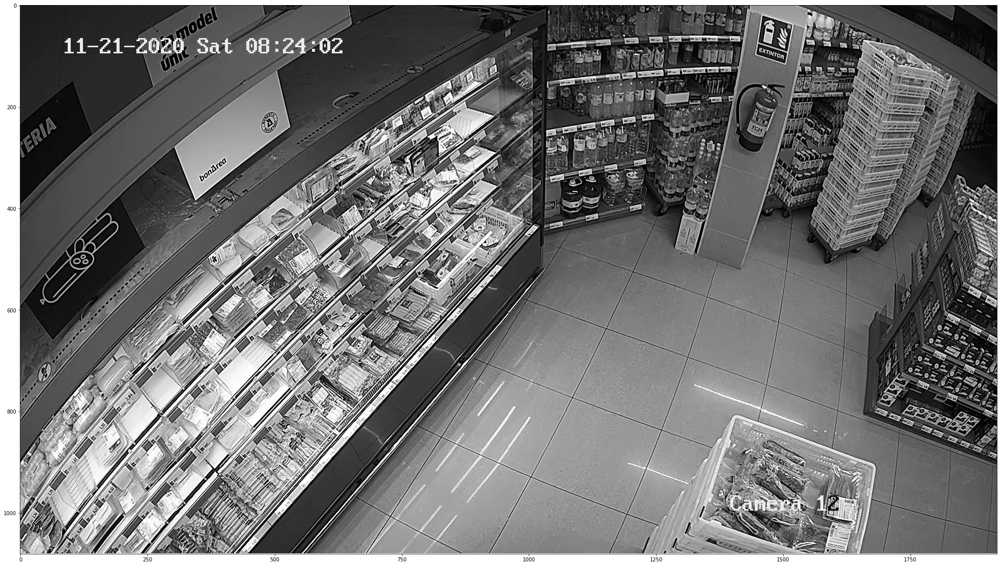

In [6]:
baseline_image = 'data/t485. 08.24.02.jpg'

ima_col = io.imread(baseline_image)
ima = io.imread('data/t485. 08.24.02.jpg',as_gray=True)
#ima = transform.resize(ima,np.divide(ima.shape,2).astype(int),mode='reflect') 
ima = ima/np.amax(ima)
display_image(ima,size=1)

In [7]:
def MultiResolution(ima, filter, p1, p2):
  g0 = ima
  if filter == 'gaussian':
    g1 = filters.gaussian(g0,sigma=p1)
    g2 = filters.gaussian(g1,sigma=p2)
  elif filter == 'erosion':
    g1 = morphology.erosion(g0,morphology.disk(p1))
    g2 = morphology.erosion(g1,morphology.disk(p2))
  elif filter == 'dilation':
    g1 = morphology.dilation(g0,morphology.disk(p1))
    g2 = morphology.dilation(g1,morphology.disk(p2))
  elif filter == 'opening':
    g1 = morphology.opening(g0,morphology.disk(p1))
    g2 = morphology.opening(g1,morphology.disk(p2))
  elif filter == 'closing':
    g1 = morphology.closing(g0,morphology.disk(p1))
    g2 = morphology.closing(g1,morphology.disk(p2))
  elif filter == 'alternating':
    tm = morphology.opening(g0,morphology.disk(p1))
    g1 = morphology.closing(tm,morphology.disk(p1))    
    tm = morphology.opening(g1,morphology.disk(p2))
    g2 = morphology.closing(tm,morphology.disk(p2))
  elif filter == 'opening_rec':
    tm = morphology.erosion(g0,morphology.disk(p1))
    g1 = morphology.reconstruction(tm,g0,method='dilation')
    tm = morphology.erosion(g1,morphology.disk(p2))
    g2 = morphology.reconstruction(tm,g1,method='dilation')
  elif filter == 'closing_rec':
    tm = morphology.dilation(g0,morphology.disk(p1))
    g1 = morphology.reconstruction(tm,g0,method='erosion')
    tm = morphology.dilation(g1,morphology.disk(p2))
    g2 = morphology.reconstruction(tm,g1,method='erosion')
  elif filter == 'alternating_rec':
    tm = morphology.erosion(g0,morphology.disk(p1))
    tn = morphology.reconstruction(tm,g0,method='dilation')
    tm = morphology.dilation(tn,morphology.disk(p1))
    g1 = morphology.reconstruction(tm,tn,method='erosion')
    tm = morphology.erosion(g1,morphology.disk(p2))
    tn = morphology.reconstruction(tm,g1,method='dilation')
    tm = morphology.dilation(tn,morphology.disk(p2))
    g2 = morphology.reconstruction(tm,tn,method='erosion')
  else:
    print('Unknown filter')
  l1 = g0 - g1
  l2 = g1 - g2
  return l1, l2, g2
  

# Apply mask and histogram to baseline image to be able to segment future images

In [8]:
ima_hsv = color.rgb2hsv(ima_col)

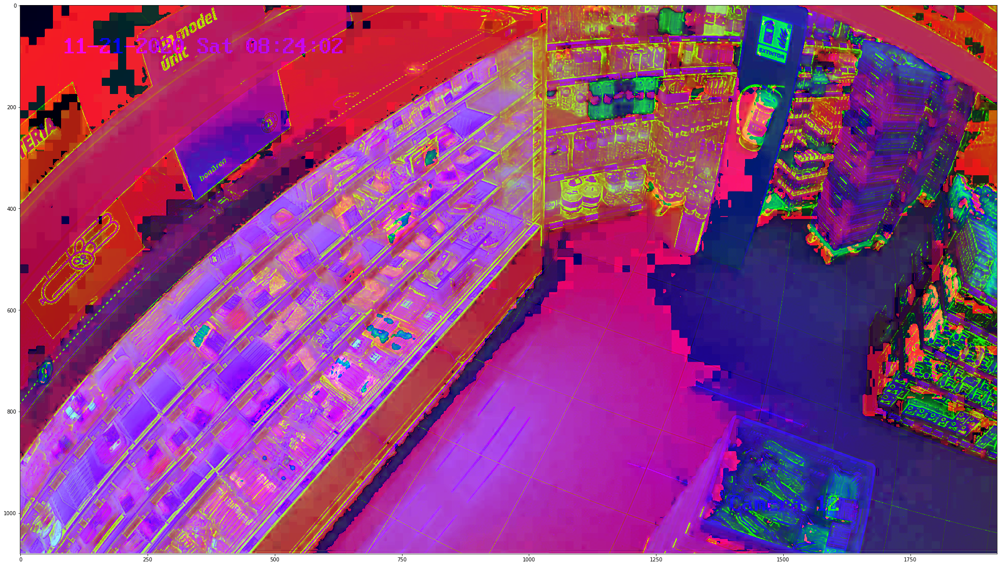

In [9]:
display_image(ima_hsv, size = 1)

In [10]:
mask = np.zeros([ima_hsv.shape[0], ima_hsv.shape[1]])

In [11]:
for y in range(mask.shape[0]):
  for x in range(mask.shape[1]):
    if x < 950 and -0.85*x + 880 < y and -1*x + 1350 > y:
      mask[y, x] = 1

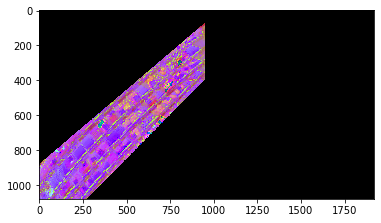

In [12]:
display_image(np.repeat(mask[:, :, np.newaxis], 3, axis=2)*ima_hsv)

In [13]:
def rgb2hsv(image):
    new_img = color.rgb2hsv(image)
    return new_img


def getMaskedPixels(img, mask):
    inv_mask = mask #mask*-1 + 1
    
    img_reshape = img.reshape(img.shape[0]*img.shape[1], 3)
    mask_reshape = inv_mask.reshape(inv_mask.shape[0]*inv_mask.shape[1])
    
    assert img.shape[0]*img.shape[1] == inv_mask.shape[0]*inv_mask.shape[1]
    
    pixels = np.array([pixel_img for pixel_img, pixel_mask in zip(img_reshape, mask_reshape) if round(pixel_mask) == 1.0])
    
    return pixels

def calculateHist(images, bins = 50, transformation = rgb2hsv):
    values_cr_hist = np.zeros(bins)
    values_cb_hist = np.zeros(bins)
    edges = np.zeros(bins+1)
    for idx, image in enumerate(images):
        new_img = transformation(image)
        masked_image = getMaskedPixels(new_img, mask)
        Cr, Cb = masked_image[:,0]*255, masked_image[:,1]*255
        Cr_hist = np.histogram(Cr, range = (0, 255), bins = bins)
        Cb_hist = np.histogram(Cb, range = (0, 255), bins = bins)
        
        values_cr_hist += Cr_hist[0]
        values_cb_hist += Cb_hist[0]
        edges = Cr_hist[1]
        
    #values_cr_hist[0] = 0
    #values_cb_hist[0] = 0
    
    values_cr_hist /= sum(values_cr_hist)
    values_cb_hist /= sum(values_cb_hist)
    
    
    return edges, values_cr_hist, values_cb_hist


hists = calculateHist([ima_hsv], bins = 100, transformation = rgb2hsv)
edges, values_cr_hist, values_cb_hist = hists

In [14]:
"""
plt.figure(figsize=(13,5))
plt.subplot(1,2,1)
plt.bar(edges[:-1], values_cb_hist)
plt.title("Saturation")
plt.subplot(1,2,2)
plt.bar(edges[:-1], values_cr_hist)
plt.title("Hue")
plt.show()
"""

'\nplt.figure(figsize=(13,5))\nplt.subplot(1,2,1)\nplt.bar(edges[:-1], values_cb_hist)\nplt.title("Saturation")\nplt.subplot(1,2,2)\nplt.bar(edges[:-1], values_cr_hist)\nplt.title("Hue")\nplt.show()\n'

In [15]:
from numba import jit


#Predecir la máscara
def predictMask(image, histograms, transformation = rgb2hsv, th = 0.1):
    shape = image.shape[:-1]
    predict_mask = np.zeros(shape)
    new_img = transformation(image)
    for i in range(shape[0]):
        for j in range(shape[1]):
            predict_mask[i,j] = mask_value(new_img[i,j,:], histograms, th)
            
    return predict_mask

@jit
def mask_value(pixel, hists, th):
    cr = pixel[0]*255
    cb = pixel[1]*255
    edges, values_cr_hist, values_cb_hist = hists
    
    cr_value = 0
    cb_value = 0
    seen_cr = False
    seen_cb = False
    
    for i, edge in enumerate(edges):
        if cr < edge and not seen_cr:
            cr_value = values_cr_hist[i-1]    #Valor respecto el primer histograma
            seen_cr = True
        if cb < edge and not seen_cb:
            cb_value = values_cb_hist[i-1]    #Valor respecto el segundo histograma
            seen_cb = True
            
    final_value = np.array(values_cr_hist).max()/(cr_value+10e-10)
    final_value += np.array(values_cb_hist).max()/(cb_value+10e-10)
    final_value = 2/final_value
    
    #Binarizar
    if final_value > th:
        final_value = 1
    else:
        final_value = 0
    
    return final_value

In [16]:
#mask_pred = predictMask(ima_hsv, hists, transformation = rgb2hsv, th = 0.75)

<ipython-input-15-72a797f76b11>:15: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "mask_value" failed type inference due to: Invalid use of Function(<built-in function array>) with argument(s) of type(s): (array(float64, 1d, C))
 * parameterized
In definition 0:
    TypingError: array(float64, 1d, C) not allowed in a homogeneous sequence
    raised from /usr/local/lib/python3.6/dist-packages/numba/typing/npydecl.py:472
In definition 1:
    TypingError: array(float64, 1d, C) not allowed in a homogeneous sequence
    raised from /usr/local/lib/python3.6/dist-packages/numba/typing/npydecl.py:472
This error is usually caused by passing an argument of a type that is unsupported by the named function.
[1] During: resolving callee type: Function(<built-in function array>)
[2] During: typing of call at <ipython-input-15-72a797f76b11> (34)


File "<ipython-input-15-72a797f76b11>", line 34:
def mask_value(pixel, hists, th):
    <source elided

KeyboardInterrupt: ignored

Remat

In [17]:
def read_ima(path):
  ima_col = io.imread(path)
  ima = io.imread(path,as_gray=True)
  #ima = transform.resize(ima,np.divide(ima.shape,2).astype(int),mode='reflect') 
  ima = ima/np.amax(ima)

  return ima, ima_col

def get_empty(ima):
  grad_img = cv2.Laplacian(ima,cv2.CV_64F)

  ret,thresh1 = cv2.threshold(grad_img,0.2,1,cv2.THRESH_BINARY)

  se1 = np.ones((17,17))
  ima_dil = nd.grey_dilation(thresh1,     footprint=se1, mode='constant', cval=0)
  ima_clo = nd.grey_erosion (ima_dil, footprint=se1, mode='constant', cval=1)

  return ima_clo

def get_mask(ima_col):
  ima_hsv = color.rgb2hsv(ima_col)
  mask_pred = predictMask(ima_hsv, hists, transformation = rgb2hsv, th = 0.75)
  se1 = np.ones((6,6))
  ima_dil = nd.grey_dilation(mask_pred,     footprint=se1, mode='constant', cval=0)
  ima_clo = nd.grey_erosion (ima_dil, footprint=se1, mode='constant', cval=1)

  markers = measure.label(ima_clo,connectivity=2)
  count_labels = Counter(markers.flatten())
  second_most_common_label = count_labels.most_common(2)[1][0]
  target_area = (markers == second_most_common_label).astype(float)

  se1 = np.ones((90,90)) 
  target_area_dil = nd.grey_dilation(target_area,     footprint=se1, mode='constant', cval=0)
  target_area_clo = nd.grey_erosion (target_area_dil, footprint=se1, mode='constant', cval=1)

  #se2 = np.ones((80,80)) 
  #target_area_dil = nd.grey_dilation(target_area_clo,     footprint=se2, mode='constant', cval=0)

  return target_area_clo

def predict_empty(ima_col, prediction):
  labels_pred = measure.label(prediction, background = 1, connectivity=2)
  labels_pred_counter = Counter(labels_pred.flatten())

  background = labels_pred_counter.most_common(1)[0][0]
  shelf = labels_pred_counter.most_common(2)[1][0]

  #get empty slots
  empty_slots = []
  for value, count in labels_pred_counter.items():
    if value not in (background, shelf):
      if count > 100:
        empty_slots.append(value)
        
  #paint empty slots red and background white  
  labels_pred_red = np.repeat(labels_pred.copy()[:, :, np.newaxis] , 3, axis=2)
  for i in range(labels_pred_red.shape[0]):
    for j in range(labels_pred_red.shape[1]):
      if labels_pred[i,j] in empty_slots:
        labels_pred_red[i,j,:] = [255,0,0]
      else:
        labels_pred_red[i,j,:] = [255,255,255]
        
  #Blurring  
  labels_pred_red_blur = cv2.blur(labels_pred_red,(60,60))

  #Merge original image with mask with red slots 
  ima_col_final = ima_col.copy()
  for i in range(labels_pred_red.shape[0]):
    for j in range(labels_pred_red.shape[1]):
      if labels_pred[i,j] in empty_slots:
        ima_col_final[i,j,:] = labels_pred_red_blur[i,j]

  return ima_col_final

In [18]:
path = 'data/t485. 08.24.02.jpg'

In [19]:
ima, ima_col = read_ima(path)
empty = get_empty(ima)
mask_target = get_mask(ima_col)
prediction = predict_empty(ima_col, empty*mask_target)

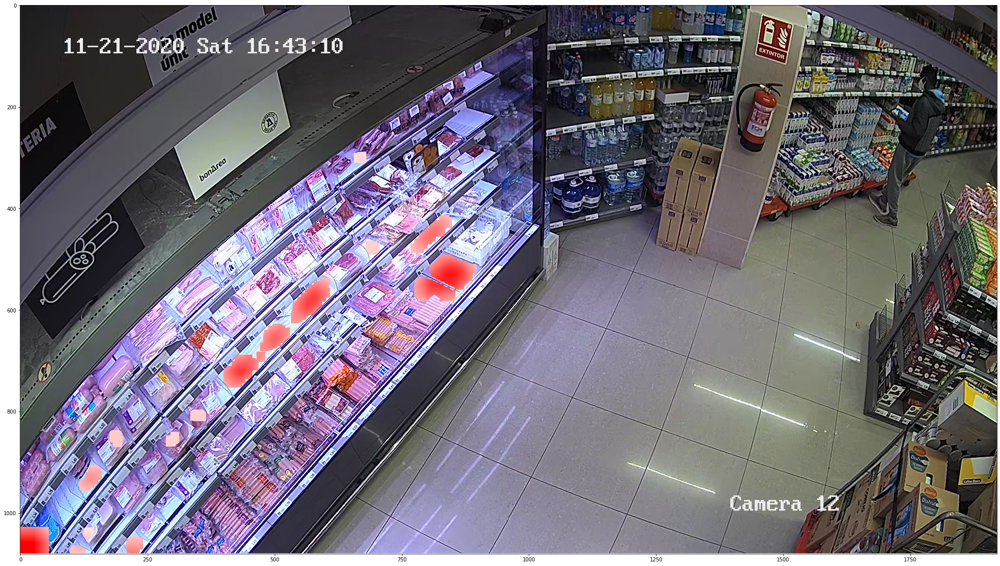

In [26]:
display_image(prediction, size = 1)

In [21]:
def BonArea_algorithm(path):
  ima, ima_col = read_ima(path)
  empty = get_empty(ima)
  mask_target = get_mask(ima_col)
  prediction = predict_empty(ima_col, empty*mask_target)

  return prediction

In [ ]:
input_path = "./data/"
output_path = "./drive/MyDrive/HackEPS2020/BonArea/predictions/"

files = os.listdir(input_path)

for file in files:
  print("Processing file ", file)
  prediction = BonArea_algorithm(input_path + file)

  #save_image
  im_rgb = cv2.cvtColor(np.float32(prediction), cv2.COLOR_BGR2RGB)
  cv2.imwrite(output_path + "out_" + file, im_rgb)

Processing file  t485. 16.43.10.jpg
